# Use PEP Dataset to Detect County Level Migration
**Contents:**
* [Preprocess](#county)
* [Net Migration Rate for each county from 2000-2020](#NMR)
* [Net Migration Rate for each year](#year)
* [Regression Analysis](#re)

In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import contextily as cx
import statsmodels.api as sm
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
from scipy.stats import pearsonr, spearmanr
from scipy.stats import ttest_ind
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from matplotlib.colors import ListedColormap

# from pgmpy.models import BayesianNetwork
# from pgmpy.estimators import MaximumLikelihoodEstimator
# from pgmpy.inference import VariableElimination
# from pgmpy.estimators import HillClimbSearch, BicScore
# import matplotlib.pyplot as plt
# import networkx as nx

# Preprocess <a class="anchor" id="county"></a>

In [3]:
data_path = r"F:/IRS_Migration/"
SHELDUS = pd.read_csv("F:/SHELDUS/ORIGINAL.csv")
state    = gpd.read_file("D:/Users/xiang11/Documents/GitHub/EvacuationIan/datasets/usstate/cb_2018_us_state_500k.shp").to_crs('ESRI:102003')
county  = gpd.read_file("D:/Users/xiang11/Documents/GitHub/EvacuationIan/datasets/maincounty/us_conu_county.shp").to_crs('ESRI:102003')
df_pep_2010 = pd.read_csv(r"F:\PEP\co-est2010-alldata.csv", encoding='latin-1')
df_pep_2020 = pd.read_csv(r"F:\PEP\co-est2020-alldata.csv", encoding='latin-1')
SVI_10 = pd.read_csv(r"F:\PEP\SVI_2010_US_county.csv")

SVI_10['FIPS'] = SVI_10['FIPS'].astype("str").str.rjust(5,"0")

state = state[~state["NAME"].isin(["Alaska","Hawaii","Puerto Rico",
                                   "American Samoa","United States Virgin Islands",
                                   "Guam","Commonwealth of the Northern Mariana Islands"])]

## SHELDUS DOC
https://cemhs.asu.edu/sheldus/metadata

In [4]:
SHELDUS['County FIPS'] = SHELDUS['County FIPS'].str.replace("'", "")
SHELDUS_0020 = SHELDUS[(SHELDUS["Year"]<2021) & (SHELDUS["Year"]>2000)]

In [5]:
SHELDUS_0020_sel = SHELDUS_0020[SHELDUS_0020["Hazard"].isin(['Flooding','Hurricane/Tropical Storm','Wildfire'])].reset_index(drop=True)
SHELDUS_0020_use = SHELDUS_0020_sel[(SHELDUS_0020_sel["Fatalities"]!=0)|(SHELDUS_0020_sel["Injuries"]!=0)|(SHELDUS_0020_sel["PropertyDmgPerCapita(ADJ 2020)"]>1)]
SHELDUS_0020_use_group = SHELDUS_0020_use.groupby(["County FIPS","Hazard","Year"]).agg({"Month":"count",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()
SHELDUS_0020_use_group = SHELDUS_0020_use_group.rename(columns={"Month":"count"})
df_20_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()


In [6]:
conditions1 = [
    SHELDUS_0020_use_group["Year"].between(2001,2011, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2011,2021, inclusive="left")
]

choices1 = ["2001-2010", "2011-2020"]

SHELDUS_0020_use_group['decade'] = np.select(conditions1, choices1, default=np.nan)


conditions2 = [
    SHELDUS_0020_use_group["Year"].between(2001,2006, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2006,2011, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2011,2016, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2016,2021, inclusive="left")
]

choices2 = ["2001-2005", "2006-2010","2011-2015", "2016-2020"]

SHELDUS_0020_use_group['interval'] = np.select(conditions2, choices2, default=np.nan)

In [7]:
df_10_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard","decade"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()

df_5_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard","interval"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()


In [8]:
SHELDUS_20_use_flooding  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Flooding"]
SHELDUS_20_use_hurricane = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_20_use_wildfire  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Wildfire"]

SHELDUS_10_use_flooding  = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Flooding"]
SHELDUS_10_use_hurricane = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_10_use_wildfire  = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Wildfire"]

SHELDUS_5_use_flooding   = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Flooding"]
SHELDUS_5_use_hurricane  = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_5_use_wildfire   = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Wildfire"]

In [9]:
def classify_impact(data, value_column):
    Q1 = data[value_column].quantile(0.25)
    Q3 = data[value_column].quantile(0.75)
    
    def classification(value):
        if value <= Q1:
            return 'Low Impact'
        elif value <= Q3:
            return 'Moderate Impact'
        else:
            return 'High Impact'
    
    return data[value_column].apply(classification)

In [10]:
Q1_20_flooding = SHELDUS_20_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_flooding = SHELDUS_20_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_20_hurricane = SHELDUS_20_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_hurricane = SHELDUS_20_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_20_wildfire = SHELDUS_20_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_wildfire = SHELDUS_20_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_flooding = SHELDUS_10_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_flooding = SHELDUS_10_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_hurricane = SHELDUS_10_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_hurricane = SHELDUS_10_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_wildfire = SHELDUS_10_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_wildfire = SHELDUS_10_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

In [11]:
SHELDUS_20_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_wildfire['ImpactLevel'] = classify_impact(SHELDUS_20_use_wildfire, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_10_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_10_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_wildfire['ImpactLevel'] = classify_impact(SHELDUS_10_use_wildfire, "PropertyDmgPerCapita(ADJ 2020)")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_10448\3703201973.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_10448\3703201973.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_10

In [12]:
SHELDUS_flooding_county  = list(SHELDUS_20_use_flooding["County FIPS"].unique())
SHELDUS_hurricane_county = list(SHELDUS_20_use_hurricane["County FIPS"].unique())
SHELDUS_wildfire_county  = list(SHELDUS_20_use_wildfire["County FIPS"].unique())

flooding_county  = county[county["FIPS"].isin(SHELDUS_flooding_county)].reset_index(drop=True)
hurricane_county = county[county["FIPS"].isin(SHELDUS_hurricane_county)].reset_index(drop=True)
wildfire_county  = county[county["FIPS"].isin(SHELDUS_wildfire_county)].reset_index(drop=True)

In [13]:
df_SHELDUS_20_flooding_county  = pd.merge(SHELDUS_20_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_20_hurricane_county = pd.merge(SHELDUS_20_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_20_wildfire_county  = pd.merge(SHELDUS_20_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_20_flooding_county = gpd.GeoDataFrame(df_SHELDUS_20_flooding_county,geometry="geometry")
gdf_SHELDUS_20_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_20_hurricane_county,geometry="geometry")
gdf_SHELDUS_20_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_20_wildfire_county,geometry="geometry")

df_SHELDUS_10_flooding_county  = pd.merge(SHELDUS_10_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_10_hurricane_county = pd.merge(SHELDUS_10_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_10_wildfire_county  = pd.merge(SHELDUS_10_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_10_flooding_county = gpd.GeoDataFrame(df_SHELDUS_10_flooding_county,geometry="geometry")
gdf_SHELDUS_10_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_10_hurricane_county,geometry="geometry")
gdf_SHELDUS_10_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_10_wildfire_county,geometry="geometry")

df_SHELDUS_5_flooding_county  = pd.merge(SHELDUS_5_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_5_hurricane_county = pd.merge(SHELDUS_5_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_5_wildfire_county  = pd.merge(SHELDUS_5_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_5_flooding_county = gpd.GeoDataFrame(df_SHELDUS_5_flooding_county,geometry="geometry")
gdf_SHELDUS_5_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_5_hurricane_county,geometry="geometry")
gdf_SHELDUS_5_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_5_wildfire_county,geometry="geometry")

In [14]:
gdf_SHELDUS_20_flooding_county_low = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_flooding_county_med = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_flooding_county_high= gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="High Impact"]

gdf_SHELDUS_20_hurricane_county_low = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_hurricane_county_med = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_hurricane_county_high= gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="High Impact"]

gdf_SHELDUS_20_wildfire_county_low = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_wildfire_county_med = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_wildfire_county_high= gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="High Impact"]

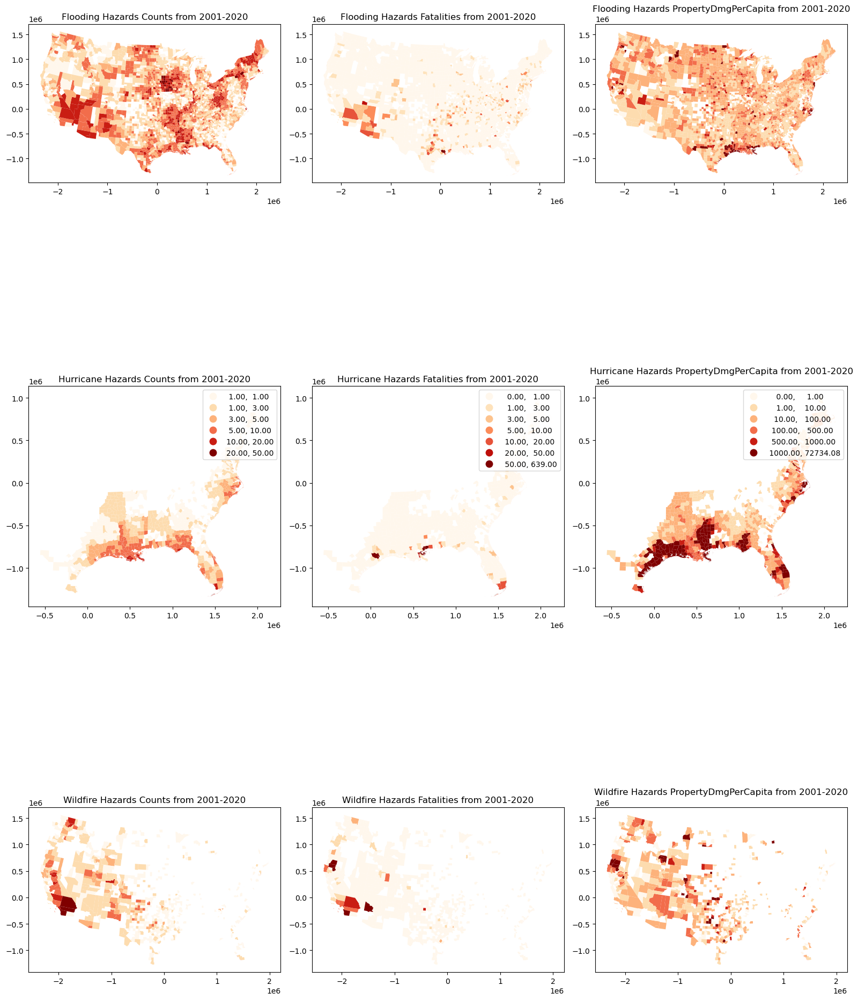

In [15]:
fig, axes = plt.subplots(3,3,figsize=(16,24))
gdf_SHELDUS_20_flooding_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
#                                     legend=True,
                                    ax=axes[0,0])
gdf_SHELDUS_20_flooding_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
#                                     legend=True,
                                    ax=axes[0,1])
gdf_SHELDUS_20_flooding_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",
#                                     legend=True,
                                    ax=axes[0,2])

gdf_SHELDUS_20_hurricane_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
                                    legend=True,
                                     ax=axes[1,0])
gdf_SHELDUS_20_hurricane_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
                                    legend=True,
                                     ax=axes[1,1])
gdf_SHELDUS_20_hurricane_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",legend=True,ax=axes[1,2])

gdf_SHELDUS_20_wildfire_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
#                                     legend=True,
                                    ax=axes[2,0])
gdf_SHELDUS_20_wildfire_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
#                                     legend=True,
                                    ax=axes[2,1])
gdf_SHELDUS_20_wildfire_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",
#                                     legend=True,
                                    ax=axes[2,2])

axes[0,0].set_title("Flooding Hazards Counts from 2001-2020")
axes[1,0].set_title("Hurricane Hazards Counts from 2001-2020")
axes[2,0].set_title("Wildfire Hazards Counts from 2001-2020")

axes[0,1].set_title("Flooding Hazards Fatalities from 2001-2020")
axes[1,1].set_title("Hurricane Hazards Fatalities from 2001-2020")
axes[2,1].set_title("Wildfire Hazards Fatalities from 2001-2020")

axes[0,2].set_title("Flooding Hazards PropertyDmgPerCapita from 2001-2020")
axes[1,2].set_title("Hurricane Hazards PropertyDmgPerCapita from 2001-2020")
axes[2,2].set_title("Wildfire Hazards PropertyDmgPerCapita from 2001-2020")

plt.tight_layout()
plt.show()

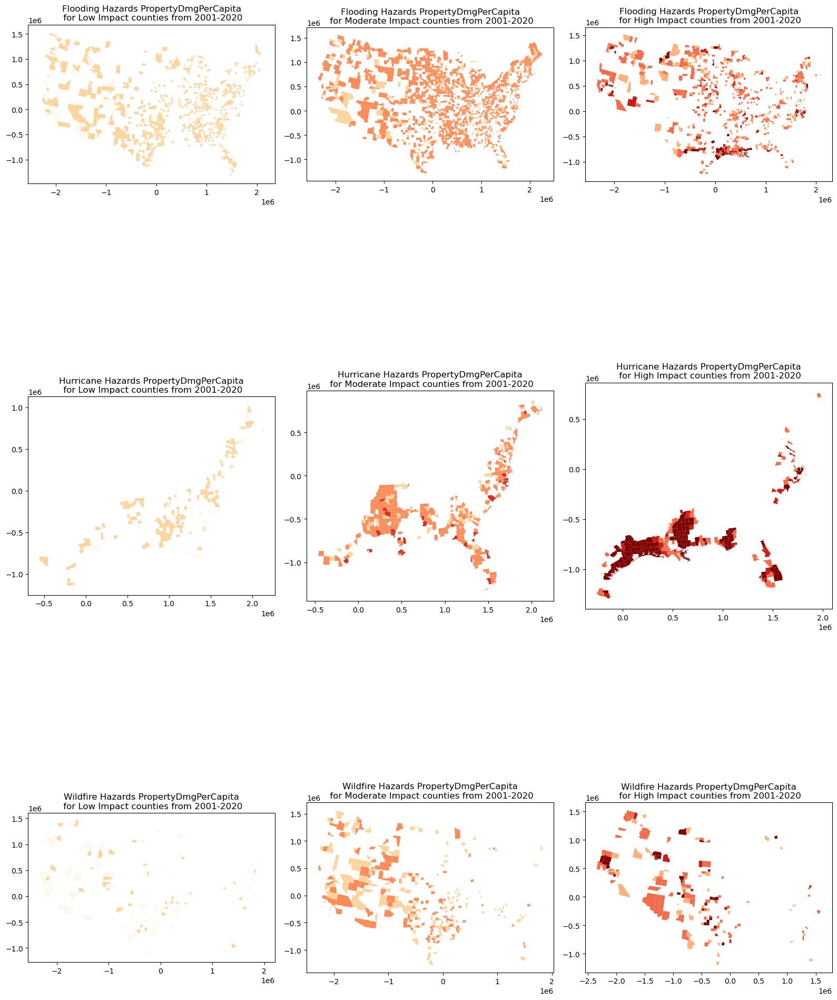

In [16]:
i = 0
fig, axes = plt.subplots(3,3,figsize=(16,24))
for level in ["Low Impact","Moderate Impact","High Impact"]:
    flooding_county_20 = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]==level]
    flooding_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[0,i])
    hurricane_county_20 = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]==level]
    hurricane_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[1,i])
    wildfire_county_20 = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]==level]
    wildfire_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[2,i])
    axes[0,i].set_title(f"Flooding Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    axes[1,i].set_title(f"Hurricane Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    axes[2,i].set_title(f"Wildfire Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    
    i = i+1
    
plt.tight_layout()
plt.show()


In [17]:
flooding_county_list_20  = []
hurricane_county_list_20 = []
wildfire_county_list_20  = []

for level in ["Low Impact","Moderate Impact","High Impact"]:
    flooding_county_20 = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]==level]
    flooding_county_list_20.append(list(flooding_county_20["County FIPS"].unique()))
    
    hurricane_county_20 = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]==level]
    hurricane_county_list_20.append(list(hurricane_county_20["County FIPS"].unique()))
    
    wildfire_county_20 = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]==level]
    wildfire_county_list_20.append(list(wildfire_county_20["County FIPS"].unique()))

In [18]:
df_pep_2010["state"] = df_pep_2010["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2010["county"] = df_pep_2010["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2010["FIPS"] = df_pep_2010["state"] + df_pep_2010["county"]

df_pep_2020["state"] = df_pep_2020["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2020["county"] = df_pep_2020["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2020["FIPS"] = df_pep_2020["state"] + df_pep_2020["county"]

In [19]:
df_pep_0120 = pd.merge(df_pep_2010,df_pep_2020,on="FIPS")

In [20]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)
        
# columns_needed = ['STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
# relevant_data = data[columns_needed]

In [21]:
columns_needed = ['FIPS','STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
relevant_data = df_pep_0120[columns_needed]

In [22]:
relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_10448\3865312276.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')


# Net Migration Rate <a class="anchor" id="NMR"></a>

### NetMigrationRate1 is calculated by average net migration rate
### NetMigrationRate2 is calculated by (migration pop/average pop * 1000)
### NetMigrationRate1 is better in the further results

In [23]:
relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
relevant_data['NetMigrationRate1'] = relevant_data[correct_netmig_columns].mean(axis=1)
relevant_data['NetMigrationRate2'] = (relevant_data['TotalNetMigration'] / relevant_data['AveragePopulation']) * 1000
final_data = relevant_data[['FIPS','STNAME_x', 'CTYNAME_x', 'TotalNetMigration', 'AveragePopulation', 'NetMigrationRate1', 'NetMigrationRate2']]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_10448\433456365.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
C:\Users\xiang11\AppData\Local\Temp\ipykernel_10448\433456365.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_10448\433456365.py:3: SettingWithCopyWarning

In [24]:
df_NMR = pd.merge(final_data,county,on="FIPS",how="inner")
gdf_NMR = gpd.GeoDataFrame(df_NMR,geometry="geometry")

In [26]:
# gdf_NMR.sort_values(by="NetMigrationRate",ascending=False)

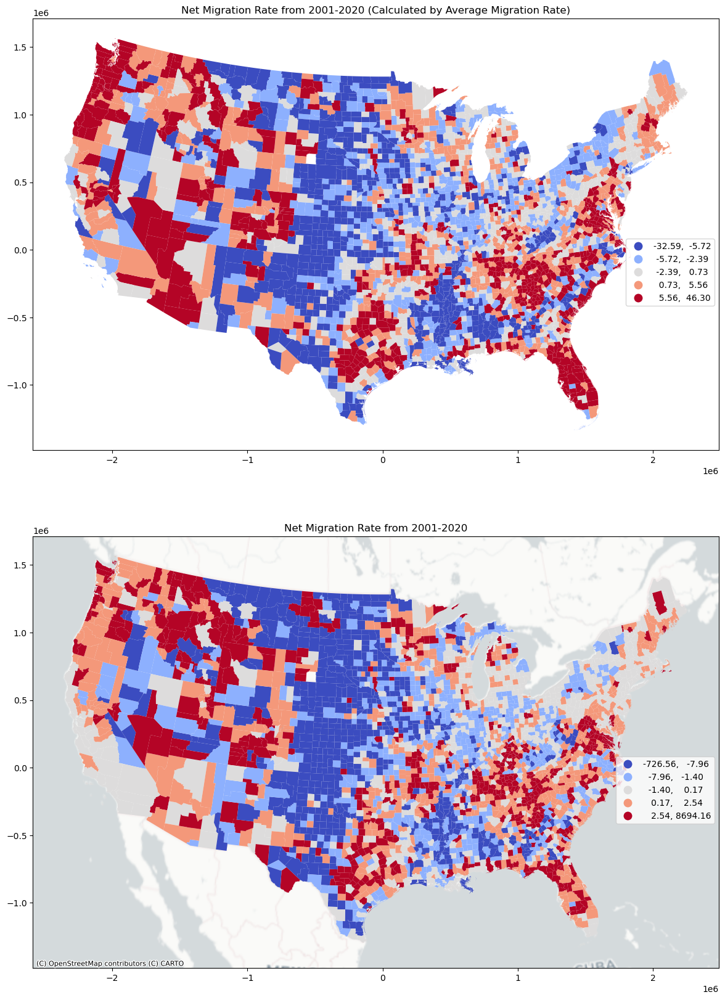

In [25]:
fig, ax = plt.subplots(2, 1, figsize=(16, 20))
gdf_NMR.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax[0])
leg = ax[0].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax[0].set_title("Net Migration Rate from 2001-2020 (Calculated by Average Migration Rate)")
gdf_NMR.plot(column="NetMigrationRate2",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax[1])
leg = ax[1].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax[1].set_title("Net Migration Rate from 2001-2020")
cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

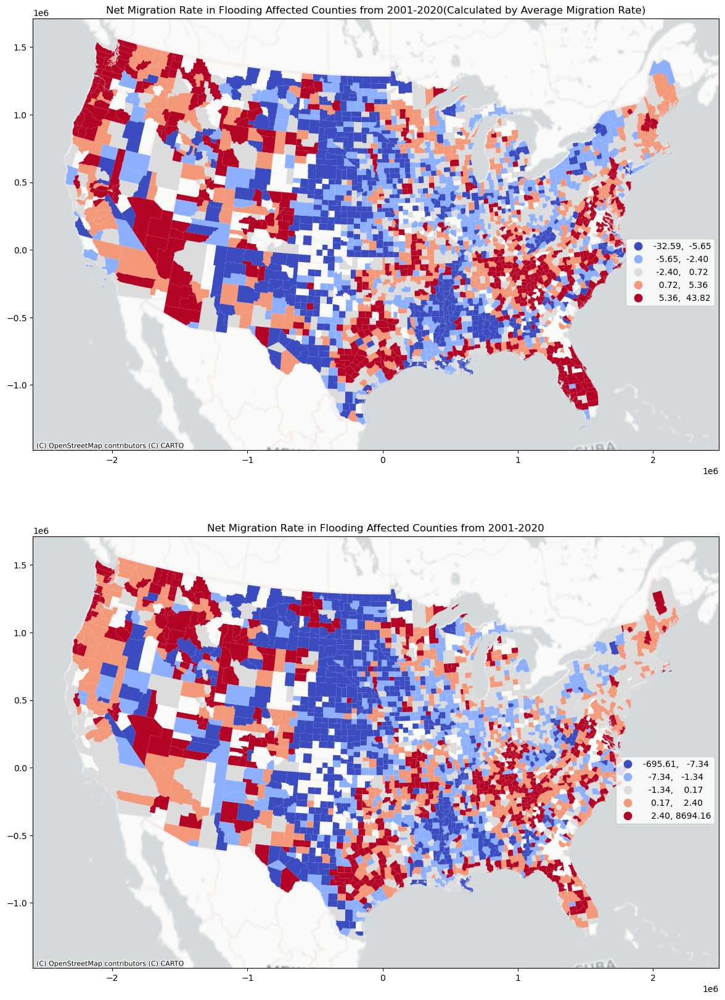

In [26]:
gdf_NMR_flooding = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_flooding_county)].reset_index(drop=True)

fig, ax = plt.subplots(2, 1, figsize=(16, 20))
gdf_NMR_flooding.plot(column="NetMigrationRate1",cmap="coolwarm",
                      scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax[0])
leg = ax[0].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax[0].set_title("Net Migration Rate in Flooding Affected Counties from 2001-2020(Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax[0], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)
gdf_NMR_flooding.plot(column="NetMigrationRate2",cmap="coolwarm",
                      scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax[1])
leg = ax[1].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax[1].set_title("Net Migration Rate in Flooding Affected Counties from 2001-2020")
cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

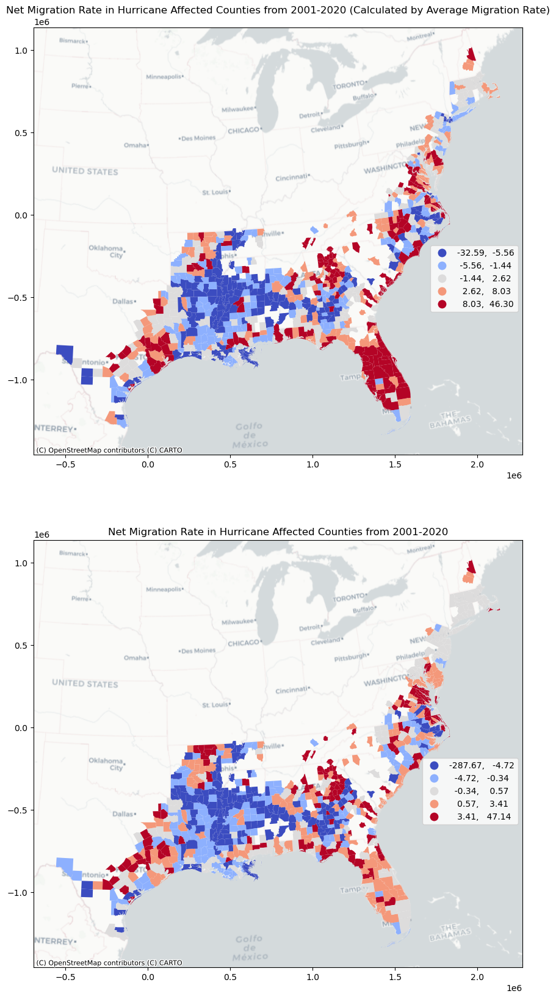

In [27]:
gdf_NMR_hurricane = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_hurricane_county)].reset_index(drop=True)

fig, ax = plt.subplots(2, 1, figsize=(16, 20))
gdf_NMR_hurricane.plot(column="NetMigrationRate1",cmap="coolwarm",
                       scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax[0])
leg = ax[0].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax[0].set_title("Net Migration Rate in Hurricane Affected Counties from 2001-2020 (Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax[0], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)
gdf_NMR_hurricane.plot(column="NetMigrationRate2",cmap="coolwarm",
                       scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax[1])
leg = ax[1].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax[1].set_title("Net Migration Rate in Hurricane Affected Counties from 2001-2020")
cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

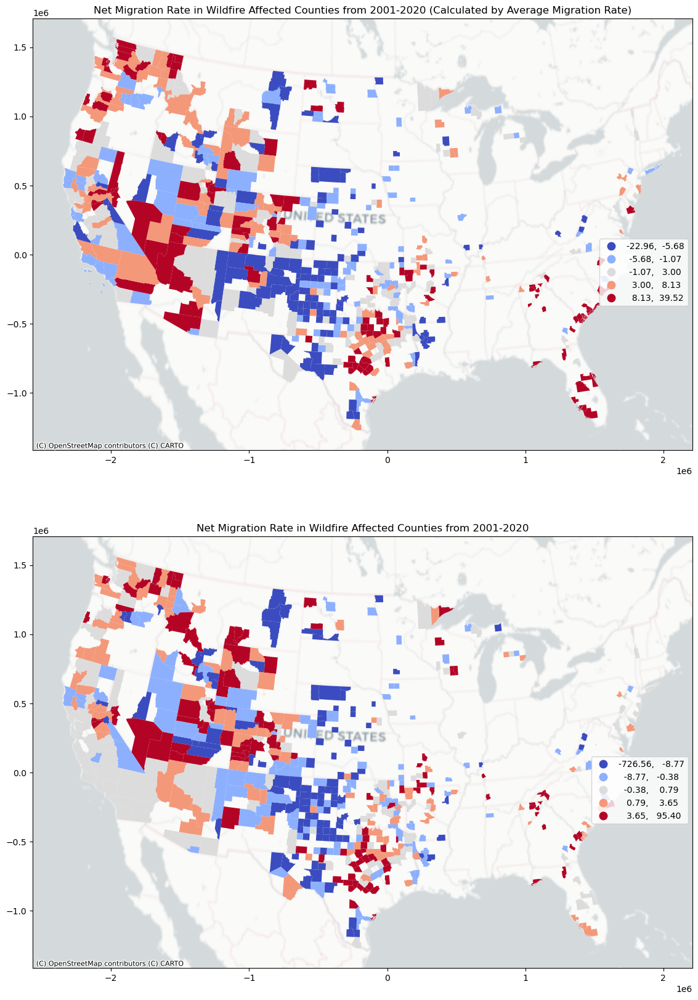

In [28]:
gdf_NMR_wildfire = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_wildfire_county)].reset_index(drop=True)

fig, ax = plt.subplots(2, 1, figsize=(16, 20))
gdf_NMR_wildfire.plot(column="NetMigrationRate1",cmap="coolwarm",
                      scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax[0])
leg = ax[0].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax[0].set_title("Net Migration Rate in Wildfire Affected Counties from 2001-2020 (Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax[0], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)
gdf_NMR_wildfire.plot(column="NetMigrationRate2",cmap="coolwarm",
                      scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax[1])
leg = ax[1].get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax[1].set_title("Net Migration Rate in Wildfire Affected Counties from 2001-2020")
cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

Three color to show the position

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


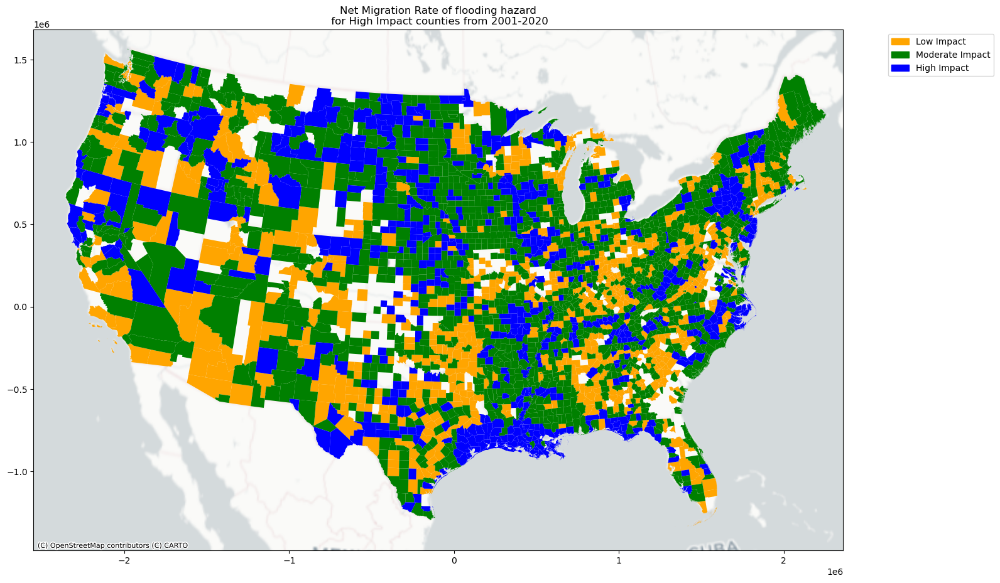

In [29]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_flooding_use = gdf_NMR[gdf_NMR["FIPS"].isin(flooding_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_flooding_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of flooding hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

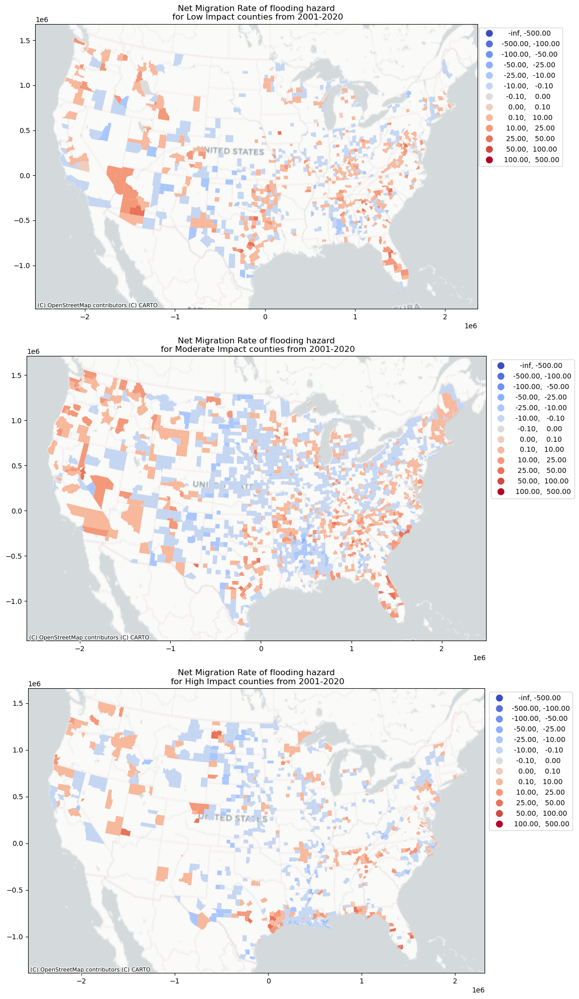

In [30]:
list_use = ["Low Impact","Moderate Impact","High Impact"]

fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_flooding_use = gdf_NMR[gdf_NMR["FIPS"].isin(flooding_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_flooding_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of flooding hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

plt.tight_layout()
plt.show()

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


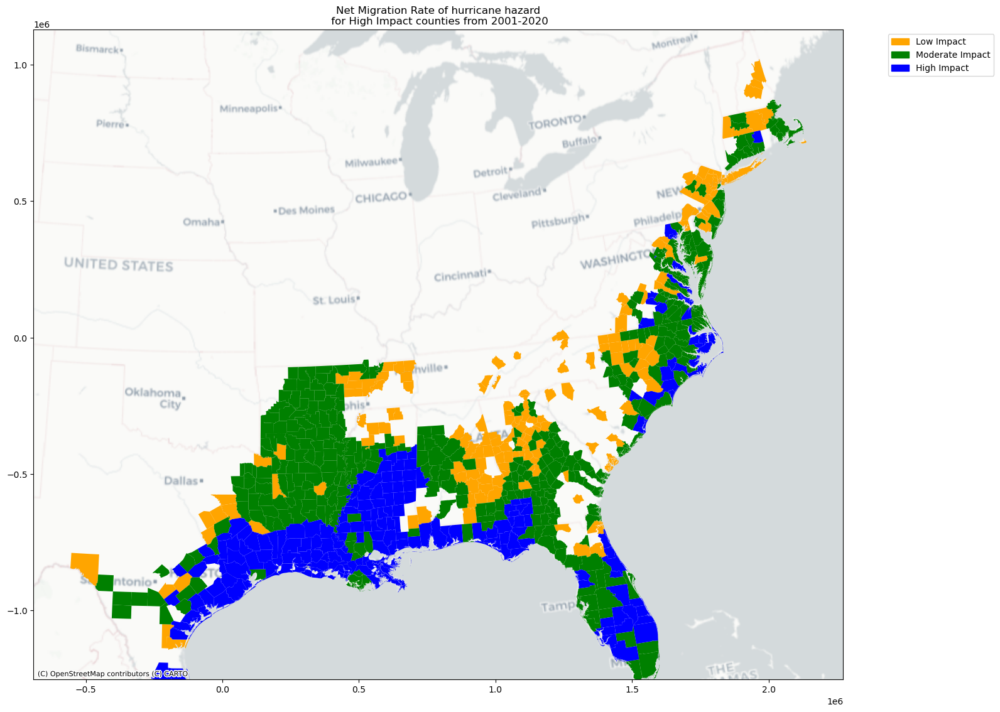

In [31]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_hurricane_use = gdf_NMR[gdf_NMR["FIPS"].isin(hurricane_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of hurricane hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

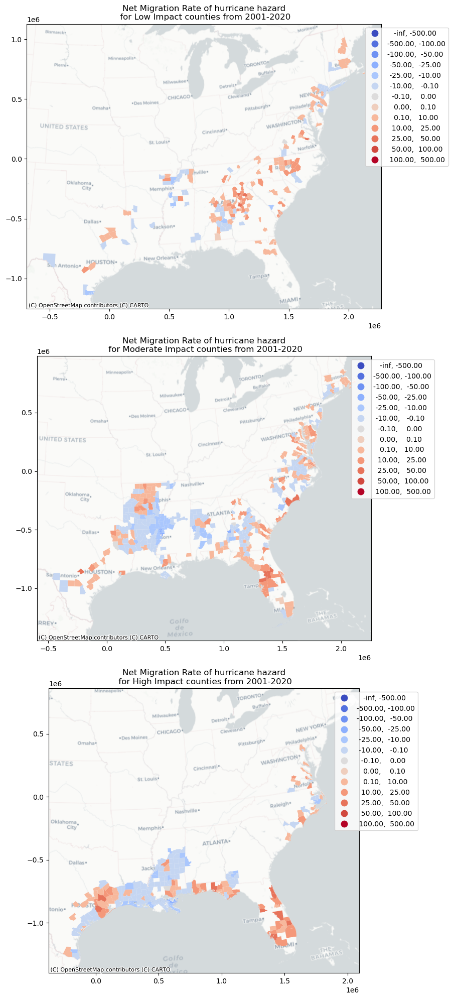

In [32]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_hurricane_use = gdf_NMR[gdf_NMR["FIPS"].isin(hurricane_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of hurricane hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_hurricane_use.crs)

plt.tight_layout()
plt.show()

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


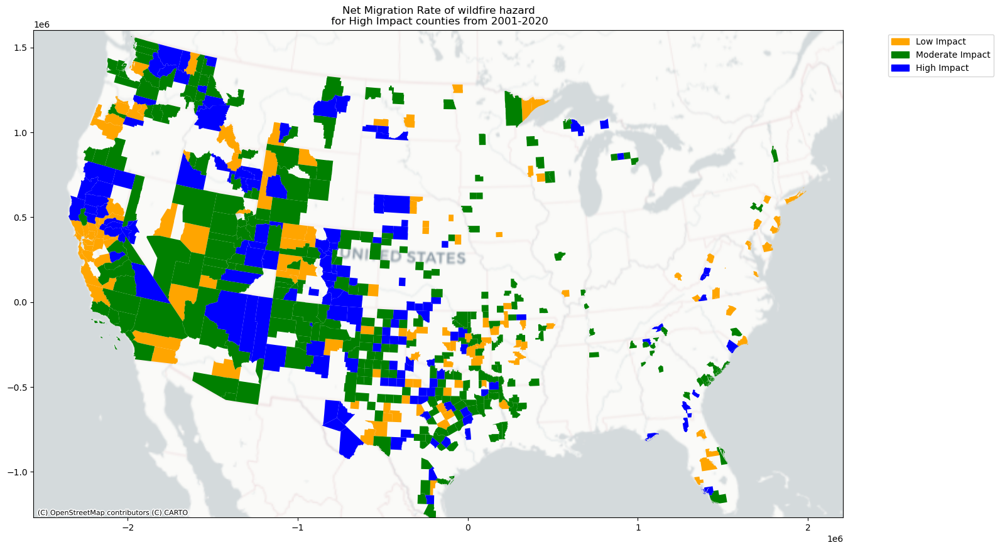

In [33]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_wildfire_use = gdf_NMR[gdf_NMR["FIPS"].isin(wildfire_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of wildfire hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

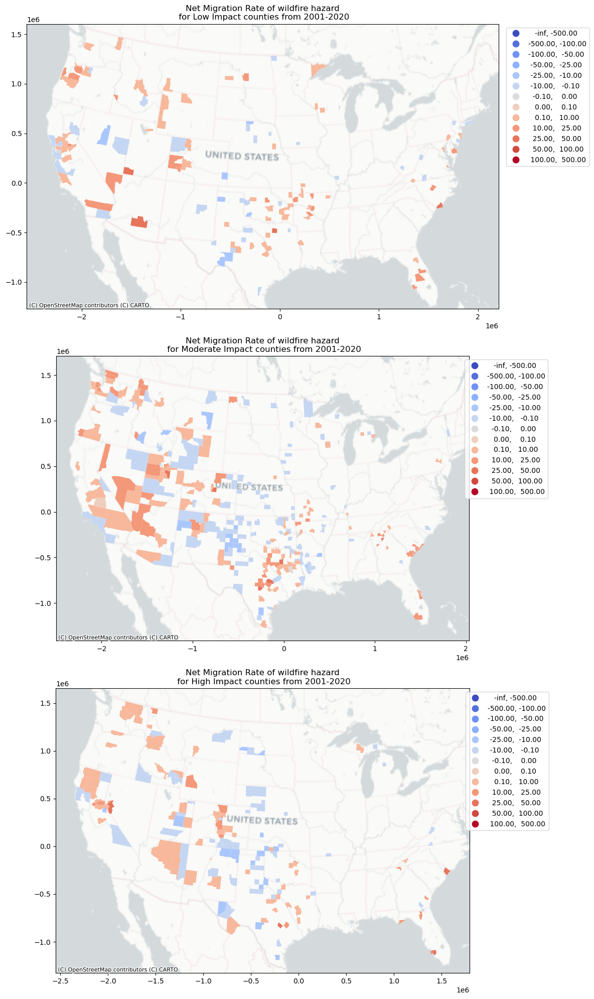

In [34]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_wildfire_use = gdf_NMR[gdf_NMR["FIPS"].isin(wildfire_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of wildfire hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_wildfire_use.crs)

plt.tight_layout()
plt.show()

# Net Migration Rate for each year <a class="anchor" id="year"></a>

In [35]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [36]:
flooding_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Flooding"]
flooding_year = flooding_year.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
flooding_year = flooding_year.rename(columns={"Month":"count"})

In [37]:
flooding_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[0])].reset_index(drop=True)
flooding_county_low_mean = flooding_county_low[correct_netmig_columns].mean()
flooding_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[1])].reset_index(drop=True)
flooding_county_med_mean = flooding_county_med[correct_netmig_columns].mean()
flooding_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[2])].reset_index(drop=True)
flooding_county_high_mean = flooding_county_high[correct_netmig_columns].mean()

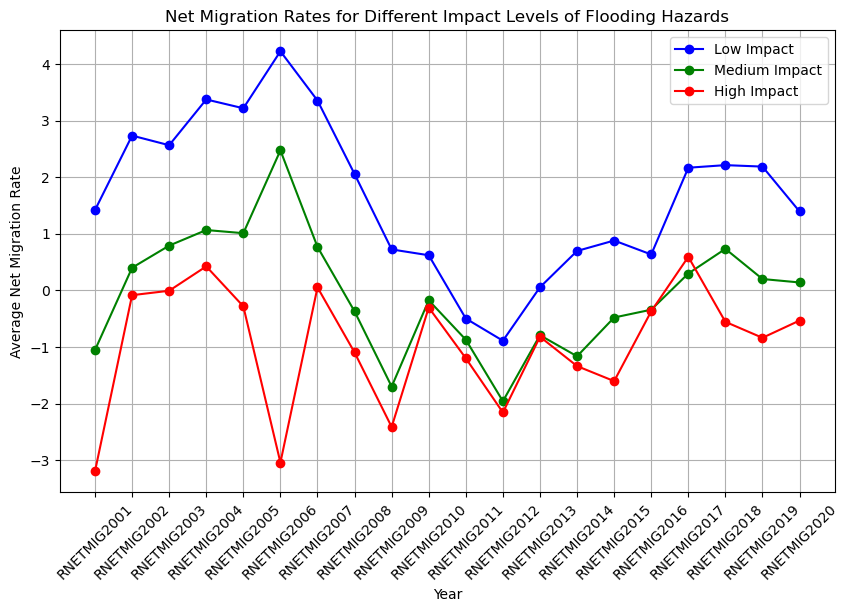

In [38]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(flooding_county_low_mean.index, flooding_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(flooding_county_med_mean.index, flooding_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(flooding_county_high_mean.index, flooding_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Flooding Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

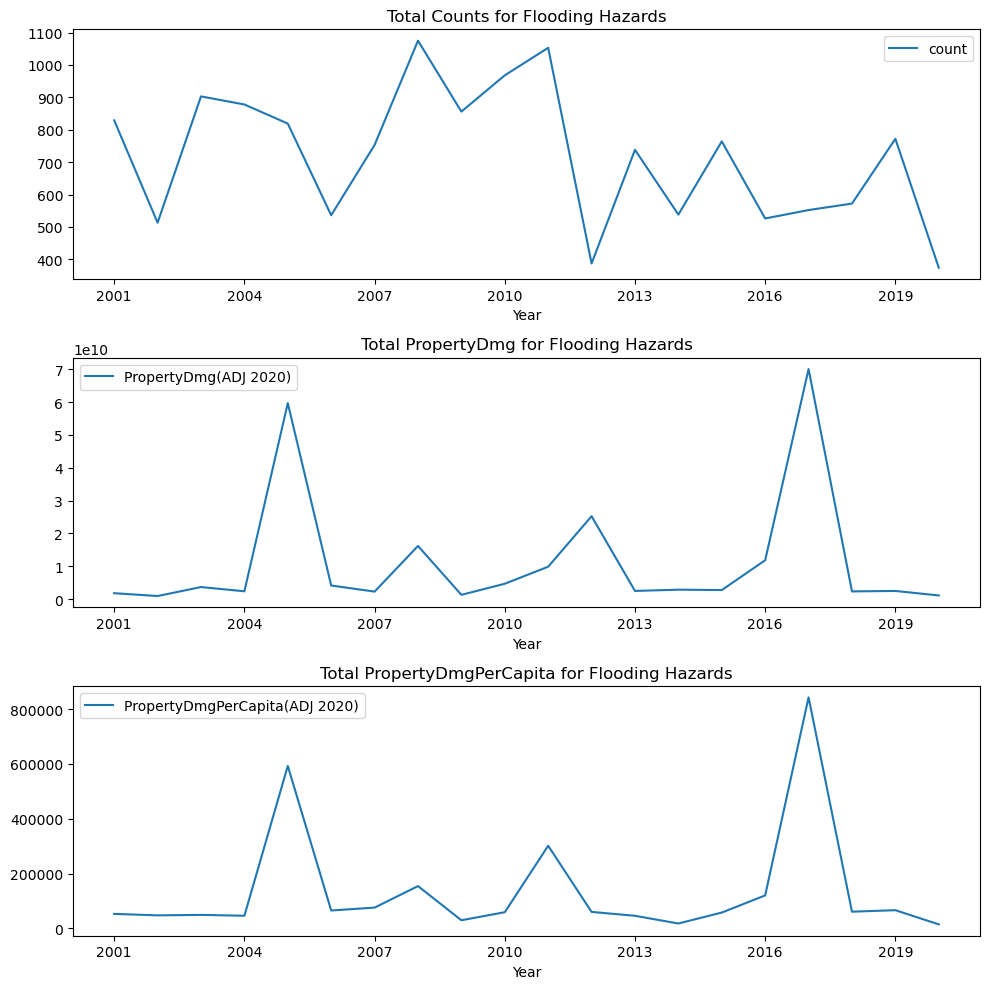

In [39]:
fig, axes = plt.subplots(3,1,figsize=(10,10))
flooding_year.plot.line("Year","count",ax=axes[0],title="Total Counts for Flooding Hazards")
flooding_year.plot.line("Year","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Flooding Hazards") 
flooding_year.plot.line("Year","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Flooding Hazards")
for ax in axes:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_xlabel("Year")
plt.tight_layout()
plt.show()

In [40]:
hurricane_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
hurricane_year = hurricane_year.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
hurricane_year = hurricane_year.rename(columns={"Month":"count"})

In [41]:
hurricane_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[0])].reset_index(drop=True)
hurricane_county_low_mean = hurricane_county_low[correct_netmig_columns].mean()
hurricane_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[1])].reset_index(drop=True)
hurricane_county_med_mean = hurricane_county_med[correct_netmig_columns].mean()
hurricane_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[2])].reset_index(drop=True)
hurricane_county_high_mean = hurricane_county_high[correct_netmig_columns].mean()

## Test why Hurricane Sandy is not showing accurately

It looks like Hurricane Sandy's damage is classified in Flooding Hazard in SHELDUS dataset.

In [61]:
SHELDUS_0020_use[SHELDUS_0020_use["Year"]==2012].sort_values("PropertyDmg",ascending=False)[0:5]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
28156,NEW JERSEY,Ocean,34029,Flooding,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,2
28140,NEW JERSEY,Monmouth,34025,Flooding,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,2
28132,NEW JERSEY,Middlesex,34023,Flooding,2012,10,0.0,0.0,0.0,5.000000e+08,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1
1833,COLORADO,El Paso,08041,Wildfire,2012,7,0.0,0.0,0.0,4.000000e+08,...,0.0,0.0,0.0,0.0,10.0,0.0,0.0,10.0,0.0,1
18855,COLORADO,El Paso,08041,Wildfire,2012,6,0.0,0.0,0.0,4.000000e+08,...,0.0,0.0,2.0,0.0,5.0,5.0,0.0,5.0,0.0,1


In [62]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2012].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
8950,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,26800000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,1
24998,LOUISIANA,Livingston,22063,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,12090000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,1
8840,LOUISIANA,Jefferson,22051,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,12040000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,2
25148,LOUISIANA,St. John the Baptist,22095,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,11800000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,1
8768,LOUISIANA,East Baton Rouge,22033,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,10190000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,1
9007,LOUISIANA,St. Bernard,22087,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,7200000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,3
24738,LOUISIANA,Assumption,22007,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,6504000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,2
9087,LOUISIANA,St. Tammany,22103,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,4760000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,1
9101,LOUISIANA,Tangipahoa,22105,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,4600000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,2
25055,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,4510000.0,...,0.0,0.0,0.0,0.0,3.0,0.0,0.0,3.0,0.0,3


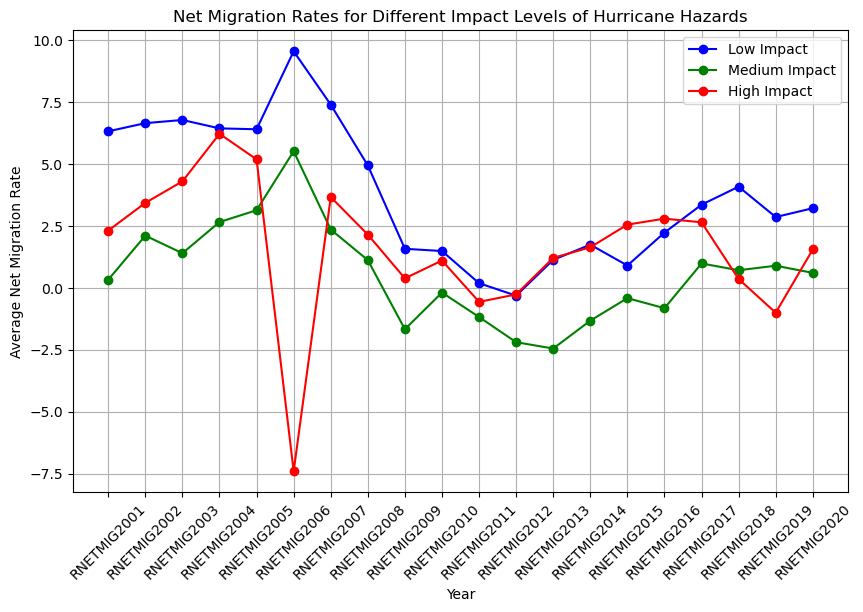

In [42]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(hurricane_county_low_mean.index, hurricane_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(hurricane_county_med_mean.index, hurricane_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(hurricane_county_high_mean.index, hurricane_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Hurricane Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

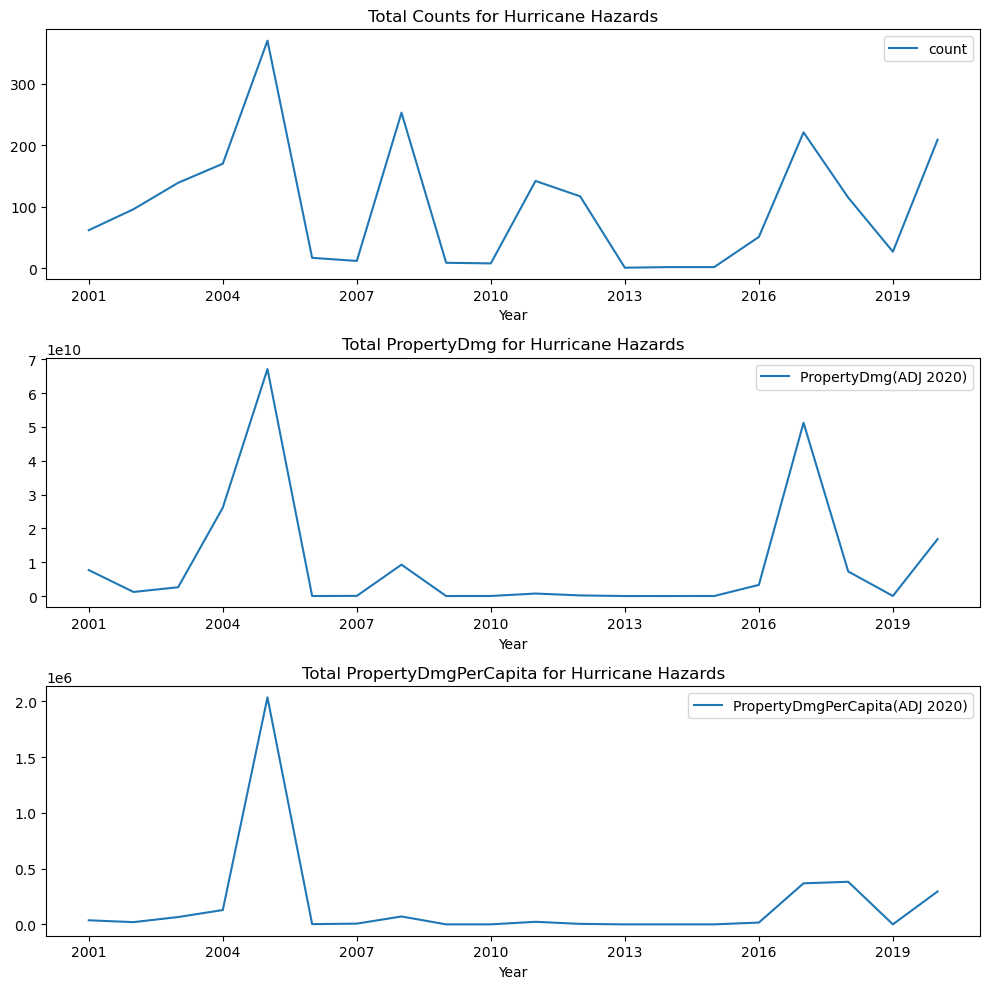

In [43]:
fig, axes = plt.subplots(3,1,figsize=(10,10))
hurricane_year.plot.line("Year","count",ax=axes[0],title="Total Counts for Hurricane Hazards")
hurricane_year.plot.line("Year","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Hurricane Hazards") 
hurricane_year.plot.line("Year","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Hurricane Hazards")
for ax in axes:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_xlabel("Year")
plt.tight_layout()
plt.show()

Hurricane sandy in 2012

In [44]:
wildfire_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Wildfire"]
wildfire_year = wildfire_year.groupby(["Hazard","Year"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
wildfire_year = wildfire_year.rename(columns={"Month":"count"})

In [45]:
wildfire_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[0])].reset_index(drop=True)
wildfire_county_low_mean = wildfire_county_low[correct_netmig_columns].mean()
wildfire_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[1])].reset_index(drop=True)
wildfire_county_med_mean = wildfire_county_med[correct_netmig_columns].mean()
wildfire_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[2])].reset_index(drop=True)
wildfire_county_high_mean = wildfire_county_high[correct_netmig_columns].mean()

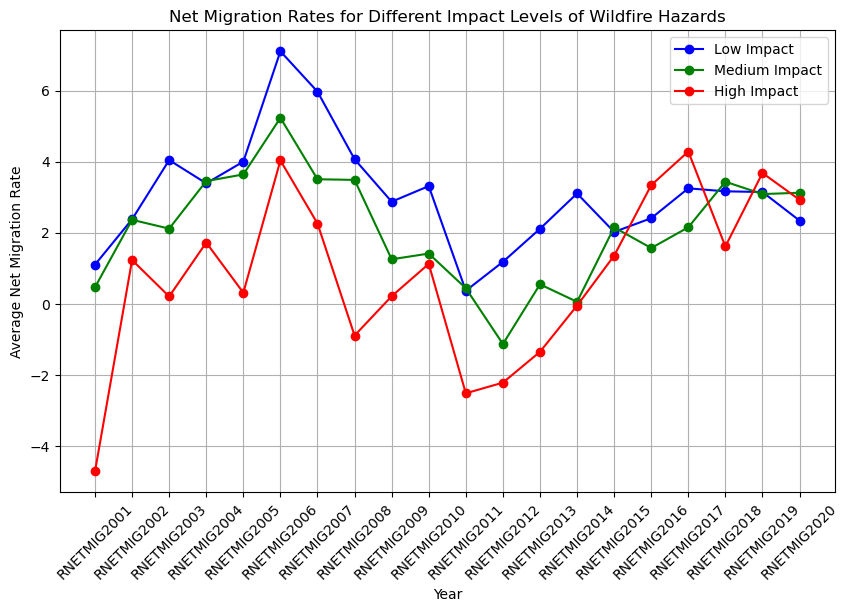

In [46]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(wildfire_county_low_mean.index, wildfire_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(wildfire_county_med_mean.index, wildfire_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(wildfire_county_high_mean.index, wildfire_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Wildfire Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

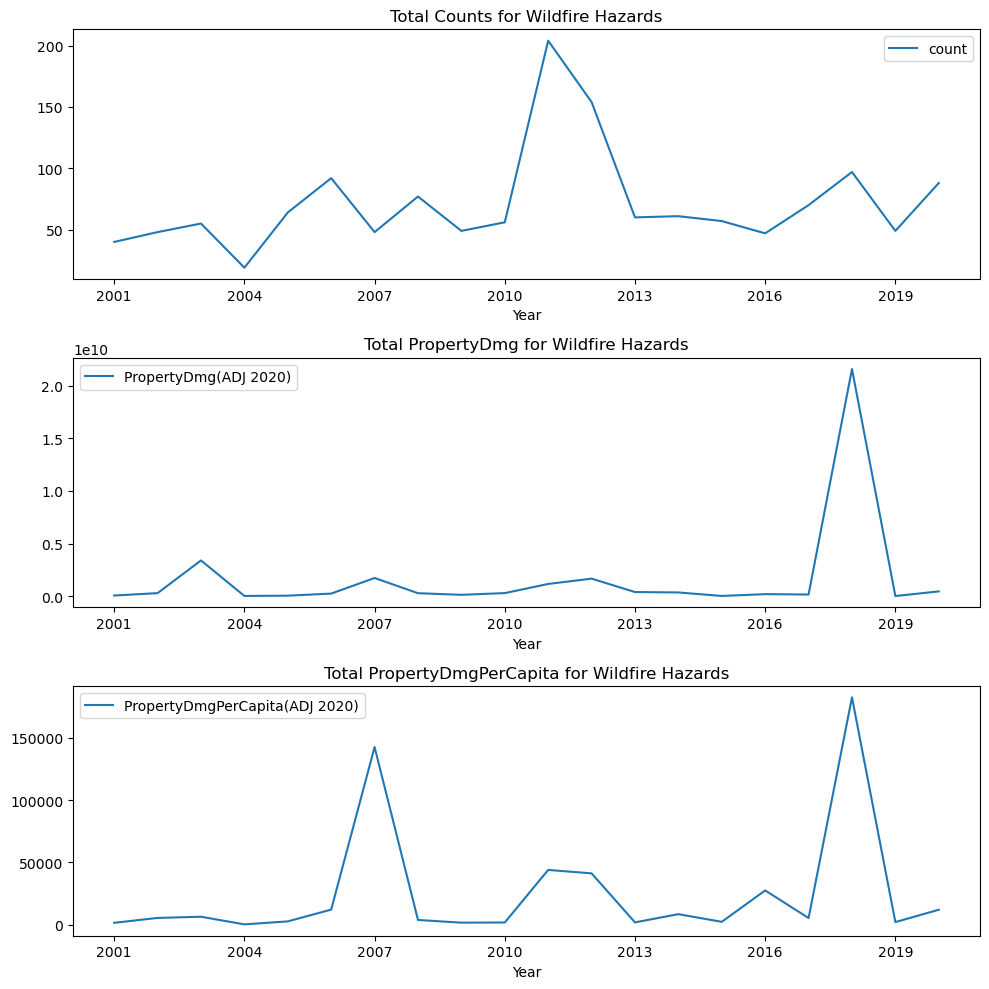

In [47]:
fig, axes = plt.subplots(3,1,figsize=(10,10))
wildfire_year.plot.line("Year","count",ax=axes[0],title="Total Counts for Wildfire Hazards")
wildfire_year.plot.line("Year","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Wildfire Hazards") 
wildfire_year.plot.line("Year","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Wildfire Hazards")
for ax in axes:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_xlabel("Year")
plt.tight_layout()
plt.show()

In [48]:
# NMR= [gdf_NMR.NetMigrationRate.mean(),gdf_NMR.NetMigrationRate.min(),gdf_NMR.NetMigrationRate.max(),gdf_NMR.NetMigrationRate.std()]
# NMR_f= [gdf_NMR_flooding.NetMigrationRate1.mean(),gdf_NMR_flooding.NetMigrationRate.min(),gdf_NMR_flooding.NetMigrationRate.max(),gdf_NMR_flooding.NetMigrationRate.std()]
# NMR_h= [gdf_NMR_hurricane.NetMigrationRate.mean(),gdf_NMR_hurricane.NetMigrationRate.min(),gdf_NMR_hurricane.NetMigrationRate.max(),gdf_NMR_hurricane.NetMigrationRate.std()]
# NMR_w= [gdf_NMR_wildfire.NetMigrationRate.mean(),gdf_NMR_wildfire.NetMigrationRate.min(),gdf_NMR_wildfire.NetMigrationRate.max(),gdf_NMR_wildfire.NetMigrationRate.std()]

count_f = [gdf_SHELDUS_20_flooding_county["count"].mean(),gdf_SHELDUS_20_flooding_county["count"].min(),gdf_SHELDUS_20_flooding_county["count"].max(),gdf_SHELDUS_20_flooding_county["count"].std()]
count_h = [gdf_SHELDUS_20_hurricane_county["count"].mean(),gdf_SHELDUS_20_hurricane_county["count"].min(),gdf_SHELDUS_20_hurricane_county["count"].max(),gdf_SHELDUS_20_hurricane_county["count"].std()]
count_w = [gdf_SHELDUS_20_wildfire_county["count"].mean(),gdf_SHELDUS_20_wildfire_county["count"].min(),gdf_SHELDUS_20_wildfire_county["count"].max(),gdf_SHELDUS_20_wildfire_county["count"].std()]

# Regression Analysis<a class="anchor" id="re"></a>

### CDC SVI 2010 is used
https://www.atsdr.cdc.gov/placeandhealth/svi/documentation/pdf/SVI-2010-Documentation-H.pdf

In [75]:
# used_list = ["E_TOTPOP","E_HU","E_POV","E_UNEMP","E_PCI","E_NOHSDIP","AGE65","AGE17","SNGPRNT","MINORITY","E_LIMENG","E_MUNIT","E_MOBILE","E_CROWD","E_NOVEH"]
used_list = ["E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT","P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ"]
# used_list = ["E_TOTPOP","E_HU","E_HH","E_POV150","E_UNEMP","E_AGE65","E_AGE17","E_SNGPNT","E_MINRTY","E_MOBILE","E_NOVEH","EP_UNEMP"]
name_list = ["BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]

In [76]:
floodingFips = list(gdf_NMR_flooding.FIPS)
gdf_SHELDUS_20_flooding_county = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips)].reset_index(drop=True)
SVI_20_use_flooding = SVI_10[SVI_10["FIPS"].isin(floodingFips)].reset_index()
gdf_SHELDUS_20_flooding_county[name_list] = SVI_20_use_flooding[used_list]

### Do the z-score normalization for each column

In [77]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county[columns_to_normalize] - gdf_SHELDUS_20_flooding_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county[columns_to_normalize].std()

### Regression results for all flooding impact counties

In [78]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_f =  gdf_SHELDUS_20_flooding_county[input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.301
Model:                            OLS   Adj. R-squared:                  0.296
Method:                 Least Squares   F-statistic:                     66.38
Date:                Mon, 29 Jul 2024   Prob (F-statistic):          3.64e-200
Time:                        04:40:40   Log-Likelihood:                -9330.6
No. Observations:                2798   AIC:                         1.870e+04
Df Residuals:                    2779   BIC:                         1.881e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Regression results for all flooding impact counties only with disaster variables

In [87]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_f =  gdf_SHELDUS_20_flooding_county[input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     22.45
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           2.87e-18
Time:                        04:43:09   Log-Likelihood:                -9786.6
No. Observations:                2798   AIC:                         1.958e+04
Df Residuals:                    2793   BIC:                         1.961e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [80]:
HurricaneList = list(gdf_SHELDUS_20_hurricane_county["County FIPS"])
SVI_20_use_hurricane = SVI_10[SVI_10["FIPS"].isin(HurricaneList)].reset_index()
gdf_SHELDUS_20_hurricane_county[name_list] = SVI_20_use_hurricane[used_list]

In [81]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county[columns_to_normalize].std()

### Regression results for all hurricane impact counties

In [82]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_h =  gdf_SHELDUS_20_hurricane_county[input_list]
Y_h =  gdf_NMR_hurricane["NetMigrationRate1"]
data = pd.concat([X_h, Y_h], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_h_clean = data[input_list]
Y_h_clean = data["NetMigrationRate1"]
X_h_clean = sm.add_constant(X_h_clean)
model = sm.OLS(Y_h_clean, X_h_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.482
Model:                            OLS   Adj. R-squared:                  0.469
Method:                 Least Squares   F-statistic:                     37.37
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           1.40e-90
Time:                        04:41:23   Log-Likelihood:                -2514.9
No. Observations:                 741   AIC:                             5068.
Df Residuals:                     722   BIC:                             5155.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Regression results for all hurricane impact counties only with disaster variables

In [88]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_h =  gdf_SHELDUS_20_hurricane_county[input_list]
Y_h =  gdf_NMR_hurricane["NetMigrationRate1"]
data = pd.concat([X_h, Y_h], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_h_clean = data[input_list]
Y_h_clean = data["NetMigrationRate1"]
X_h_clean = sm.add_constant(X_h_clean)
model = sm.OLS(Y_h_clean, X_h_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.028
Method:                 Least Squares   F-statistic:                     6.237
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           6.15e-05
Time:                        04:43:34   Log-Likelihood:                -2746.5
No. Observations:                 741   AIC:                             5503.
Df Residuals:                     736   BIC:                             5526.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [84]:
wildfireFips = list(gdf_NMR_wildfire.FIPS)
SVI_20_use_wildfire = SVI_10[SVI_10["FIPS"].isin(wildfireFips)].reset_index()
gdf_SHELDUS_20_wildfire_county[name_list] = SVI_20_use_wildfire[used_list]

In [85]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county[columns_to_normalize].std()

### Regression results for all wildfire impact counties

In [86]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_w =  gdf_SHELDUS_20_wildfire_county[input_list]
Y_w =  gdf_NMR_wildfire["NetMigrationRate1"]
data = pd.concat([X_w, Y_w], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_w_clean = data[input_list]
Y_w_clean = data["NetMigrationRate1"]
X_w_clean = sm.add_constant(X_w_clean)
model = sm.OLS(Y_w_clean, X_w_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.309
Model:                            OLS   Adj. R-squared:                  0.286
Method:                 Least Squares   F-statistic:                     13.58
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           1.02e-33
Time:                        04:42:25   Log-Likelihood:                -1970.2
No. Observations:                 566   AIC:                             3978.
Df Residuals:                     547   BIC:                             4061.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Regression results for all wildfire impact counties only with disaster variables

In [89]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_w =  gdf_SHELDUS_20_wildfire_county[input_list]
Y_w =  gdf_NMR_wildfire["NetMigrationRate1"]
data = pd.concat([X_w, Y_w], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_w_clean = data[input_list]
Y_w_clean = data["NetMigrationRate1"]
X_w_clean = sm.add_constant(X_w_clean)
model = sm.OLS(Y_w_clean, X_w_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     2.323
Date:                Mon, 29 Jul 2024   Prob (F-statistic):             0.0556
Time:                        04:43:56   Log-Likelihood:                -2070.1
No. Observations:                 566   AIC:                             4150.
Df Residuals:                     561   BIC:                             4172.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Regression results of flooding affected counties in low impact and high impact levels

In [90]:
floodingFips_low = list(flooding_county_low.FIPS)
gdf_SHELDUS_20_flooding_county_low = gdf_SHELDUS_20_flooding_county_low[gdf_SHELDUS_20_flooding_county_low["County FIPS"].isin(floodingFips_low)].reset_index(drop=True)
SVI_20_use_flooding_low = SVI_10[SVI_10["FIPS"].isin(floodingFips_low)].reset_index()
gdf_SHELDUS_20_flooding_county_low[name_list] = SVI_20_use_flooding_low[used_list]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_low[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_low[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_low[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_low[columns_to_normalize].std()
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
gdf_NMR_flooding_low = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_low)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_low[input_list]
Y_f =  gdf_NMR_flooding_low["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.300
Model:                            OLS   Adj. R-squared:                  0.282
Method:                 Least Squares   F-statistic:                     16.74
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           1.62e-43
Time:                        04:45:00   Log-Likelihood:                -2392.8
No. Observations:                 721   AIC:                             4824.
Df Residuals:                     702   BIC:                             4911.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [91]:
floodingFips_high = list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_high = gdf_SHELDUS_20_flooding_county_high[gdf_SHELDUS_20_flooding_county_high["County FIPS"].isin(floodingFips_high)].reset_index(drop=True)
SVI_20_use_flooding_high = SVI_10[SVI_10["FIPS"].isin(floodingFips_high)].reset_index()
gdf_SHELDUS_20_flooding_county_high[name_list] = SVI_20_use_flooding_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].std()
gdf_NMR_flooding_high = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_high[input_list]
Y_f =  gdf_NMR_flooding_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.311
Model:                            OLS   Adj. R-squared:                  0.292
Method:                 Least Squares   F-statistic:                     16.39
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           4.63e-42
Time:                        04:46:03   Log-Likelihood:                -2263.9
No. Observations:                 672   AIC:                             4566.
Df Residuals:                     653   BIC:                             4652.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [96]:
floodingFips_high = list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_high = gdf_SHELDUS_20_flooding_county_high[gdf_SHELDUS_20_flooding_county_high["County FIPS"].isin(floodingFips_high)].reset_index(drop=True)
SVI_20_use_flooding_high = SVI_10[SVI_10["FIPS"].isin(floodingFips_high)].reset_index()
gdf_SHELDUS_20_flooding_county_high[name_list] = SVI_20_use_flooding_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].std()
gdf_NMR_flooding_high = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_high[input_list]
Y_f =  gdf_NMR_flooding_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.043
Model:                            OLS   Adj. R-squared:                  0.038
Method:                 Least Squares   F-statistic:                     7.571
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           5.74e-06
Time:                        04:49:33   Log-Likelihood:                -2374.3
No. Observations:                 672   AIC:                             4759.
Df Residuals:                     667   BIC:                             4781.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Regression results of hurricane affected counties in low impact and high impact levels

In [92]:
hurricaneFips_low = list(hurricane_county_low.FIPS)
gdf_SHELDUS_20_hurricane_county_low = gdf_SHELDUS_20_hurricane_county_low[gdf_SHELDUS_20_hurricane_county_low["County FIPS"].isin(hurricaneFips_low)].reset_index(drop=True)
SVI_20_use_hurricane_low = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_low)].reset_index()
gdf_SHELDUS_20_hurricane_county_low[name_list] = SVI_20_use_hurricane_low[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_low[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_low[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_low[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_low[columns_to_normalize].std()
gdf_NMR_hurricane_low = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_low)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_low[input_list]
Y_f =  gdf_NMR_hurricane_low["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.520
Model:                            OLS   Adj. R-squared:                  0.466
Method:                 Least Squares   F-statistic:                     9.622
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           1.23e-17
Time:                        04:46:37   Log-Likelihood:                -582.60
No. Observations:                 179   AIC:                             1203.
Df Residuals:                     160   BIC:                             1264.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [93]:
hurricaneFips_high = list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_high = gdf_SHELDUS_20_hurricane_county_high[gdf_SHELDUS_20_hurricane_county_high["County FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
SVI_20_use_hurricane_high = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_high)].reset_index()
gdf_SHELDUS_20_hurricane_county_high[name_list] = SVI_20_use_hurricane_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].std()
gdf_NMR_hurricane_high = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_high[input_list]
Y_f =  gdf_NMR_hurricane_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.608
Model:                            OLS   Adj. R-squared:                  0.567
Method:                 Least Squares   F-statistic:                     14.74
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           3.50e-26
Time:                        04:47:22   Log-Likelihood:                -642.80
No. Observations:                 190   AIC:                             1324.
Df Residuals:                     171   BIC:                             1385.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [97]:
hurricaneFips_high = list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_high = gdf_SHELDUS_20_hurricane_county_high[gdf_SHELDUS_20_hurricane_county_high["County FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
SVI_20_use_hurricane_high = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_high)].reset_index()
gdf_SHELDUS_20_hurricane_county_high[name_list] = SVI_20_use_hurricane_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].std()
gdf_NMR_hurricane_high = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_high[input_list]
Y_f =  gdf_NMR_hurricane_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.119
Model:                            OLS   Adj. R-squared:                  0.099
Method:                 Least Squares   F-statistic:                     6.218
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           0.000102
Time:                        04:49:46   Log-Likelihood:                -719.80
No. Observations:                 190   AIC:                             1450.
Df Residuals:                     185   BIC:                             1466.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Regression results of wildfire affected counties in low impact and high impact levels¶

In [94]:
wildfireFips_low = list(wildfire_county_low.FIPS)
gdf_SHELDUS_20_wildfire_county_low = gdf_SHELDUS_20_wildfire_county_low[gdf_SHELDUS_20_wildfire_county_low["County FIPS"].isin(wildfireFips_low)].reset_index(drop=True)
SVI_20_use_wildfire_low = SVI_10[SVI_10["FIPS"].isin(wildfireFips_low)].reset_index()
gdf_SHELDUS_20_wildfire_county_low[name_list] = SVI_20_use_wildfire_low[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_low[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_low[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_low[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_low[columns_to_normalize].std()
gdf_NMR_wildfire_low = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_low)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_low[input_list]
Y_f =  gdf_NMR_wildfire_low["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.361
Model:                            OLS   Adj. R-squared:                  0.262
Method:                 Least Squares   F-statistic:                     3.645
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           1.11e-05
Time:                        04:48:02   Log-Likelihood:                -462.06
No. Observations:                 135   AIC:                             962.1
Df Residuals:                     116   BIC:                             1017.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [95]:
wildfireFips_high = list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_high = gdf_SHELDUS_20_wildfire_county_high[gdf_SHELDUS_20_wildfire_county_high["County FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
SVI_20_use_wildfire_high = SVI_10[SVI_10["FIPS"].isin(wildfireFips_high)].reset_index()
gdf_SHELDUS_20_wildfire_county_high[name_list] = SVI_20_use_wildfire_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].std()
gdf_NMR_wildfire_high = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_high[input_list]
Y_f =  gdf_NMR_wildfire_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.318
Model:                            OLS   Adj. R-squared:                  0.224
Method:                 Least Squares   F-statistic:                     3.394
Date:                Mon, 29 Jul 2024   Prob (F-statistic):           2.56e-05
Time:                        04:48:38   Log-Likelihood:                -512.09
No. Observations:                 150   AIC:                             1062.
Df Residuals:                     131   BIC:                             1119.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [98]:
wildfireFips_high = list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_high = gdf_SHELDUS_20_wildfire_county_high[gdf_SHELDUS_20_wildfire_county_high["County FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
SVI_20_use_wildfire_high = SVI_10[SVI_10["FIPS"].isin(wildfireFips_high)].reset_index()
gdf_SHELDUS_20_wildfire_county_high[name_list] = SVI_20_use_wildfire_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].std()
gdf_NMR_wildfire_high = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_high[input_list]
Y_f =  gdf_NMR_wildfire_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     1.434
Date:                Mon, 29 Jul 2024   Prob (F-statistic):              0.226
Time:                        04:50:05   Log-Likelihood:                -537.89
No. Observations:                 150   AIC:                             1086.
Df Residuals:                     145   BIC:                             1101.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Previous note

Social vulnerability
1) index
2) social vulnerability,hazards,net migration
3) Find coastal counties for hurricane

hierarchical regression

ACS in notion

climate gentrification

### Link different disaster (hard)
### Easier way, relation between population netflow and frequency disaster
move in or move out

dynamic time line
breakdown net population migration in high middle low level

different disaster level,